In [ ]:
# Projet Meteo
# NoteBook de test

In [1]:
# Import des library pour la visualisation

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [2]:
# Lecture du fichier

df = pd.read_csv('weatherAUS.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [3]:
# Information du dataframe

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [4]:
# Information sur les variables numeriques

df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [5]:
# Y a des majuscules sur le nom des colonnes je met tout en minuscule, plus simple dans le traitement

df = df.applymap(lambda s: s.lower() if type(s) == str else s)
df.columns=df.columns.str.strip().str.lower()
df.head(5)

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,humidity9am,humidity3pm,pressure9am,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,raintoday,raintomorrow
0,2008-12-01,albury,13.4,22.9,0.6,NaN,NaN,w,44.0,w,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,no,no
1,2008-12-02,albury,7.4,25.1,0.0,NaN,NaN,wnw,44.0,nnw,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,no,no
2,2008-12-03,albury,12.9,25.7,0.0,NaN,NaN,wsw,46.0,w,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,no,no
3,2008-12-04,albury,9.2,28.0,0.0,NaN,NaN,ne,24.0,se,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,no,no
4,2008-12-05,albury,17.5,32.3,1.0,NaN,NaN,w,41.0,ene,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,no,no


In [6]:
# je vais modifier le format de date, je rajoute une colonne année, mois, jour, 

df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d')

df['year'] = df['date'].dt.year.astype('int16')
df['month'] = df['date'].dt.month.astype('int16')
df['day'] = df['date'].dt.day.astype('int16')
df.head()

,date,location,mintemp,maxtemp,rainfall,evaporation,sunshine,windgustdir,windgustspeed,winddir9am,...,pressure3pm,cloud9am,cloud3pm,temp9am,temp3pm,raintoday,raintomorrow,year,month,day
0,2008-12-01,albury,13.4,22.9,0.6,NaN,NaN,w,44.0,w,...,1007.1,8.0,NaN,16.9,21.8,no,no,2008,12,1
1,2008-12-02,albury,7.4,25.1,0.0,NaN,NaN,wnw,44.0,nnw,...,1007.8,NaN,NaN,17.2,24.3,no,no,2008,12,2
2,2008-12-03,albury,12.9,25.7,0.0,NaN,NaN,wsw,46.0,w,...,1008.7,NaN,2.0,21.0,23.2,no,no,2008,12,3
3,2008-12-04,albury,9.2,28.0,0.0,NaN,NaN,ne,24.0,se,...,1012.8,NaN,NaN,18.1,26.5,no,no,2008,12,4
4,2008-12-05,albury,17.5,32.3,1.0,NaN,NaN,w,41.0,ene,...,1006.0,7.0,8.0,17.8,29.7,no,no,2008,12,5


In [8]:
# je crée une fonction pour afficher les Nombre et % de valeurs manquantes

def null_values(df):
    nv=pd.concat([df.isnull().sum(), 100 * df.isnull().sum()/df.shape[0]],axis=1).rename(columns={0:'Nombre_data', 1:'Percentage (%)'})
    return nv[nv.Nombre_data>0].sort_values('Nombre_data', ascending=False)

null_values(df)

,Nombre_data,Percentage (%)
sunshine,69835,48.009762
evaporation,62790,43.166506
cloud3pm,59358,40.807095
cloud9am,55888,38.421559
pressure9am,15065,10.356799
pressure3pm,15028,10.331363
winddir9am,10566,7.263853
windgustdir,10326,7.098859
windgustspeed,10263,7.055548
humidity3pm,4507,3.098446


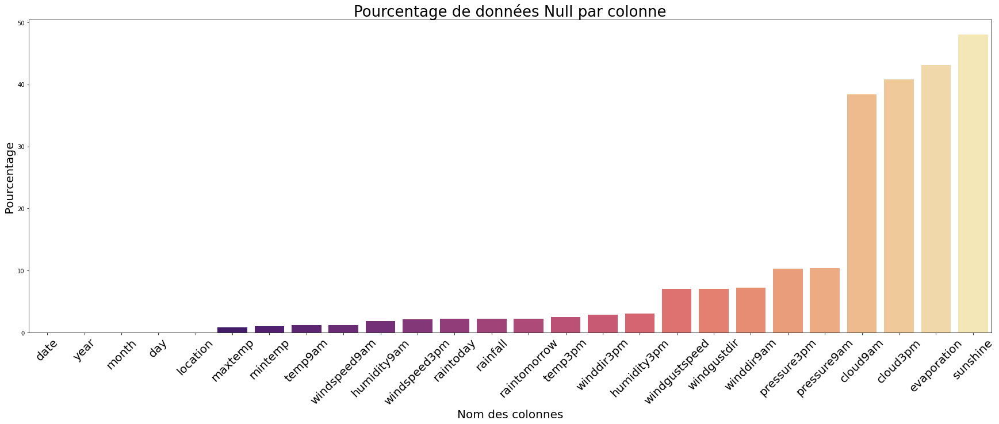

In [10]:
# La vision en graphique ets plus parlante

plt.figure(figsize=(30,10)) # 
sns.barplot(y=((df.isnull().sum()/len(df))*100).sort_values(), x=((df.isnull().sum()/len(df))*100).sort_values().index, palette='magma') 
plt.xticks(rotation=45, size=20); 
plt.title('Pourcentage de données Null par colonne', size=26)
plt.xlabel('Nom des colonnes', size=20)
plt.ylabel('Pourcentage', size=20);

In [11]:
# Je selectionne uniquement les valeurs de type Float
num_col=[]
for col in df.columns:
    if df[col].dtype=='float64':
        num_col.append(col)
        
num_col

['mintemp',
 'maxtemp',
 'rainfall',
 'evaporation',
 'sunshine',
 'windgustspeed',
 'windspeed9am',
 'windspeed3pm',
 'humidity9am',
 'humidity3pm',
 'pressure9am',
 'pressure3pm',
 'cloud9am',
 'cloud3pm',
 'temp9am',
 'temp3pm']

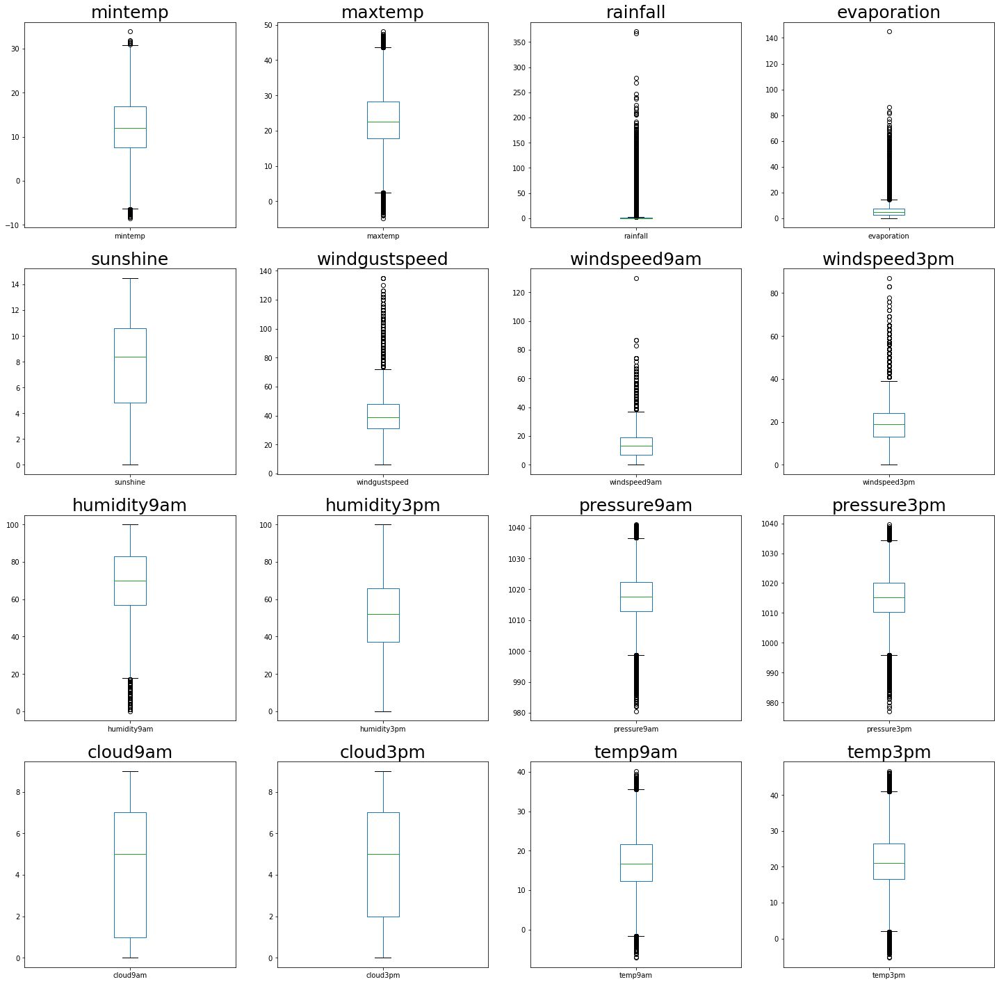

In [12]:
# j'affiche une boite a moustache pour chaque variable numerique, afin de voir si on a des valeurs aberrantes por certaines variable

fig = plt.figure(figsize=(25, 25))
for i in range(16):
    ax = fig.add_subplot(4, 4, i + 1)
    plot = df.boxplot(column=num_col[i])
    l=plt.title(num_col[i],fontsize=25)
    ax.grid(False)
plt.show()

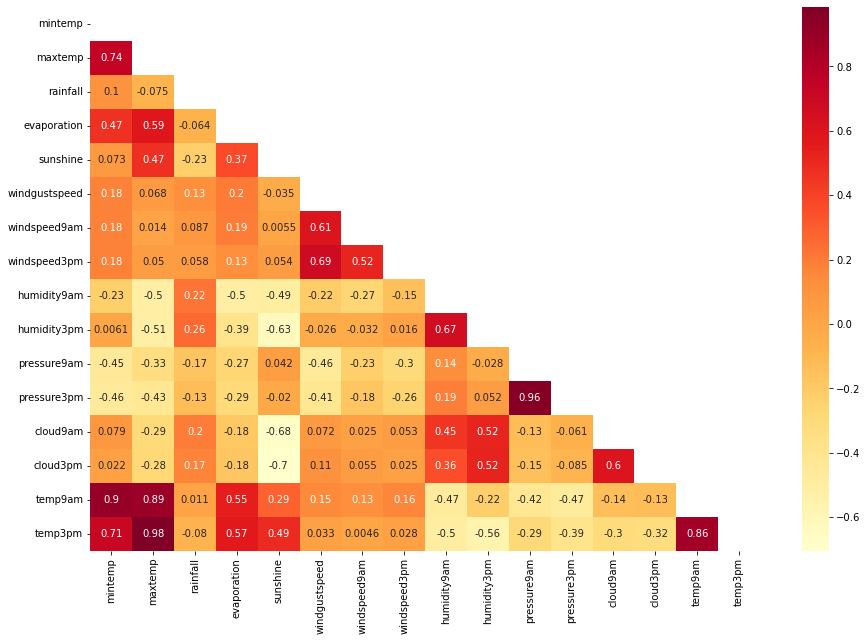

In [13]:
# j'affiche sur ces variables numeriques la correlation qu'elles ont entre elle

plt.figure(figsize=(15,10))

corr_weather = df[num_col].corr()
mask = np.triu(np.ones_like(corr_weather, dtype='float64'))
sns.heatmap(corr_weather, mask=mask,annot=True, cmap='YlOrRd')
plt.show()

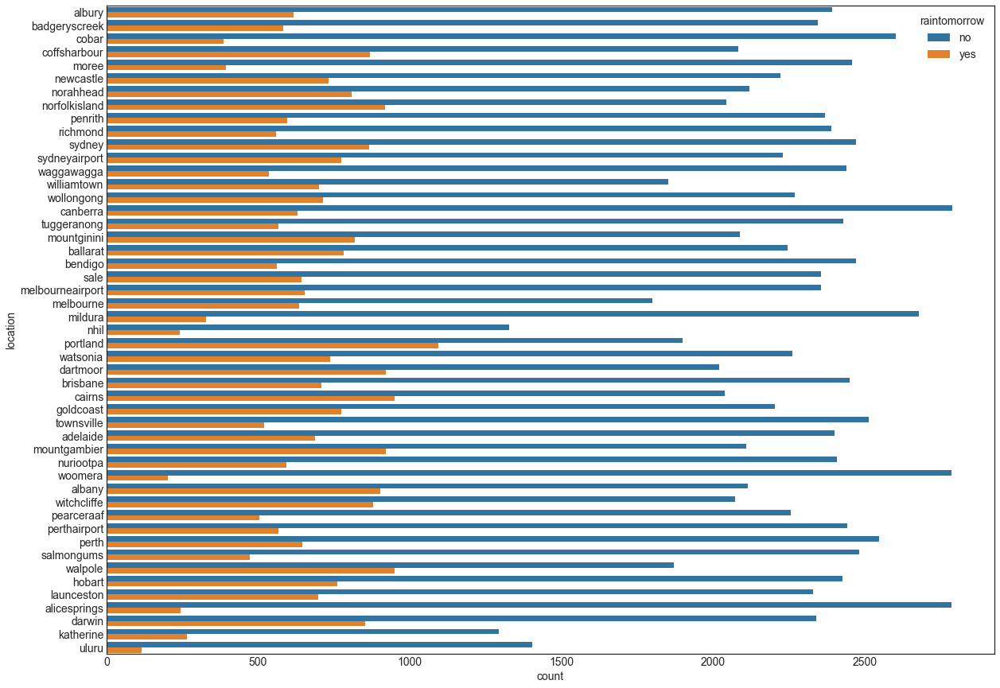

In [19]:
# est ce qu'il pleu demain par location

plt.figure(figsize=(20, 15))
sns.countplot(y = 'location', hue =  'raintomorrow', orient = 'h', data = df);

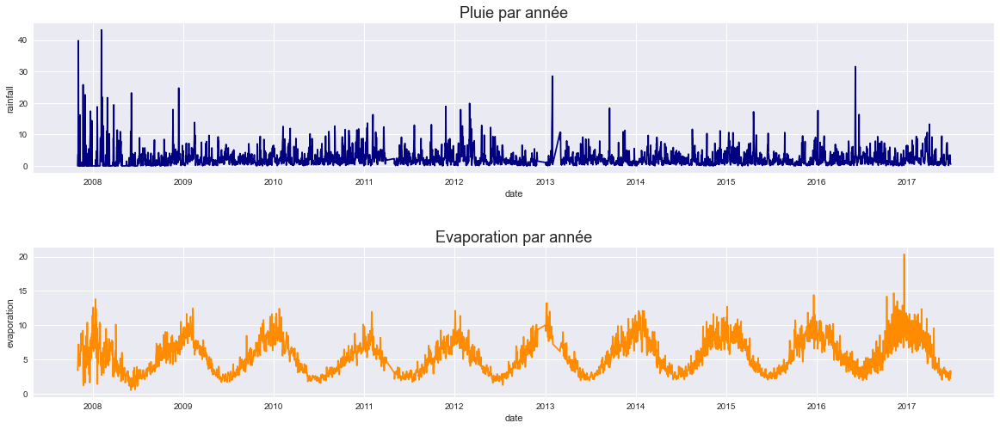

In [21]:
# Pluie par année

plt.style.use("seaborn")
fig, ax =plt.subplots(2,1, figsize=(20,8)) 

sns.lineplot(data=df, x = 'date', y = "rainfall", ci=None, ax=ax[0], color="navy")
ax[0].set_title("Pluie par année", fontsize=18)

sns.lineplot(data=df, x = 'date', y = "evaporation", ci=None, ax=ax[1], color="darkorange")
ax[1].set_title("Evaporation par année", fontsize=18)

plt.subplots_adjust(hspace = 0.5)

plt.show()

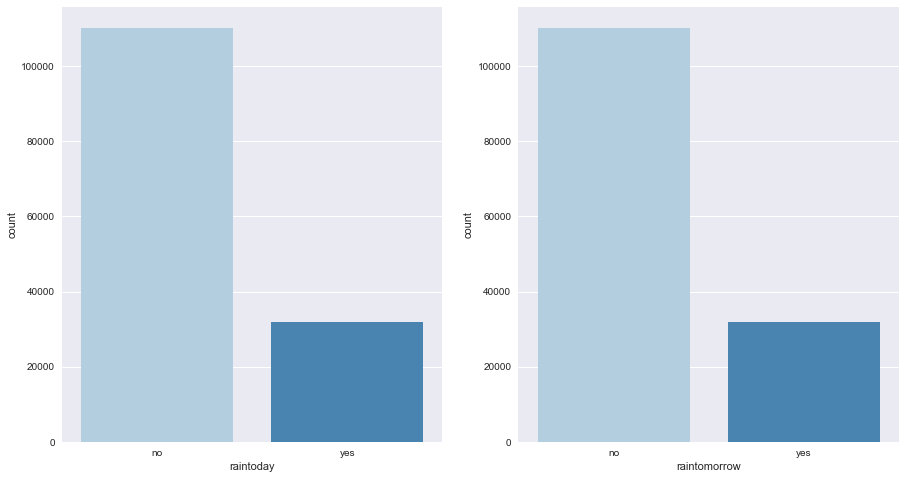

In [23]:
# Pluie aujourd'hui VS Pluie demain

plt.style.use("seaborn")
fig, ax =plt.subplots(1,2, figsize=(15,8))
sns.countplot(df["raintoday"], ax=ax[0], palette="Blues");
sns.countplot(df["raintomorrow"], ax=ax[1], palette="Blues");

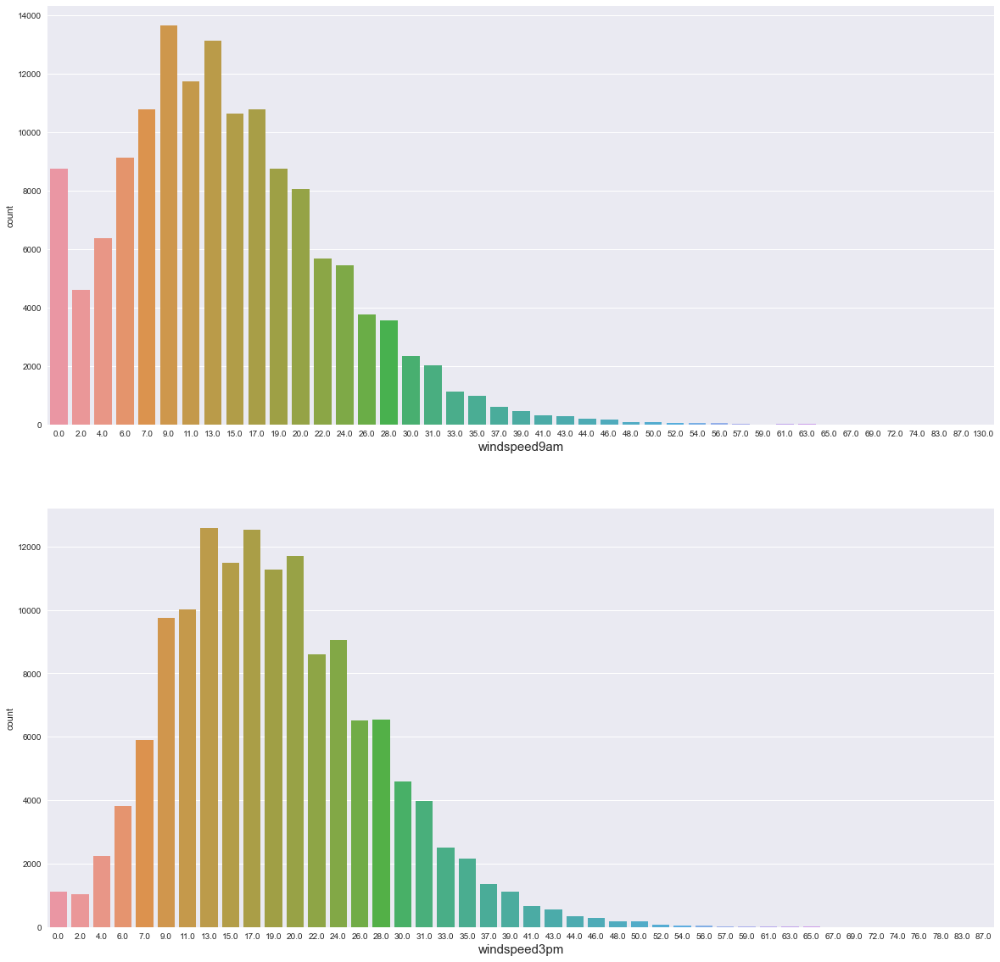

In [24]:
# Vitesse du vent à 9h VS 3h

plt.style.use("seaborn")
fig, ax =plt.subplots(2,1, figsize=(20,20))

sns.countplot(df['windspeed9am'], ax=ax[0])
ax[0].set_xlabel("windspeed9am",fontsize=15)

sns.countplot(df['windspeed3pm'], ax=ax[1])
ax[1].set_xlabel("windspeed3pm",fontsize=15);

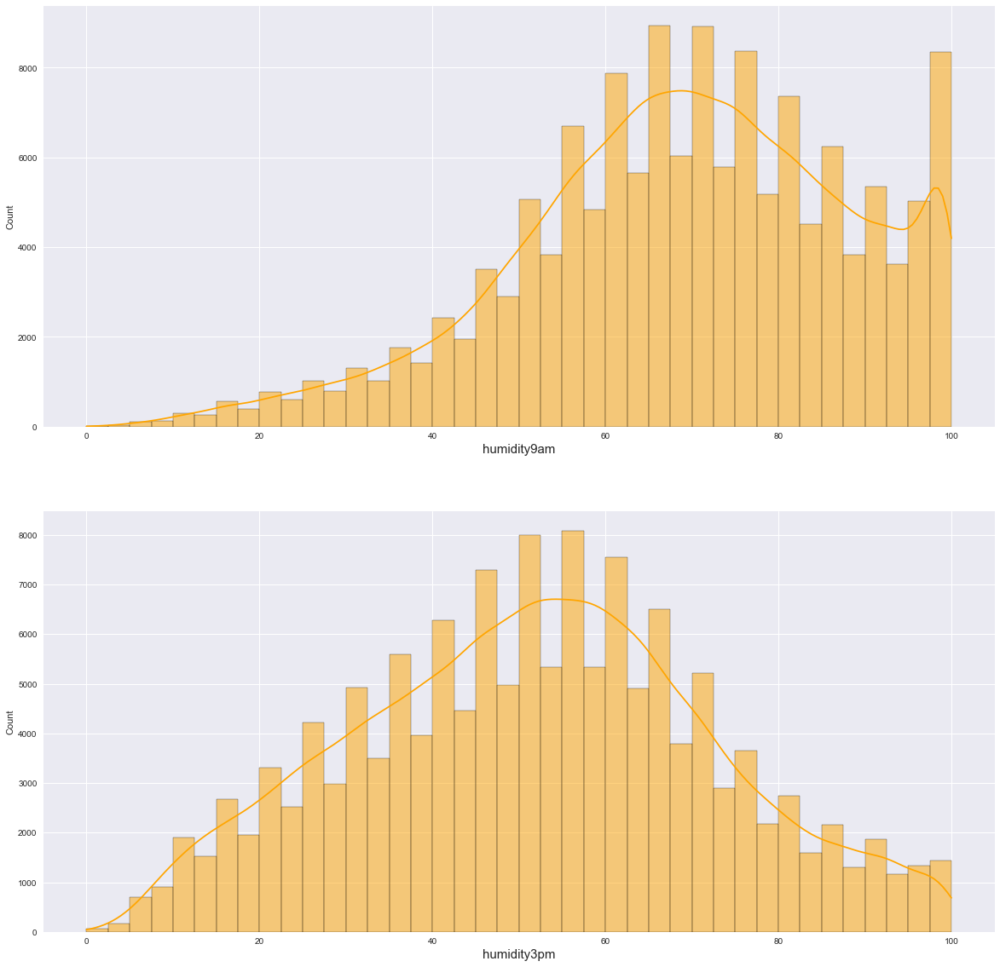

In [25]:
# Humidité à 9h VS 3h

plt.style.use("seaborn")
fig, ax =plt.subplots(2,1, figsize=(20,20))

sns.histplot(df['humidity9am'], ax=ax[0], color="orange", bins=40, kde=True)
ax[0].set_xlabel("humidity9am",fontsize=15)

sns.histplot(df['humidity3pm'], ax=ax[1], color="orange", bins=40, kde=True);
ax[1].set_xlabel("humidity3pm",fontsize=15);

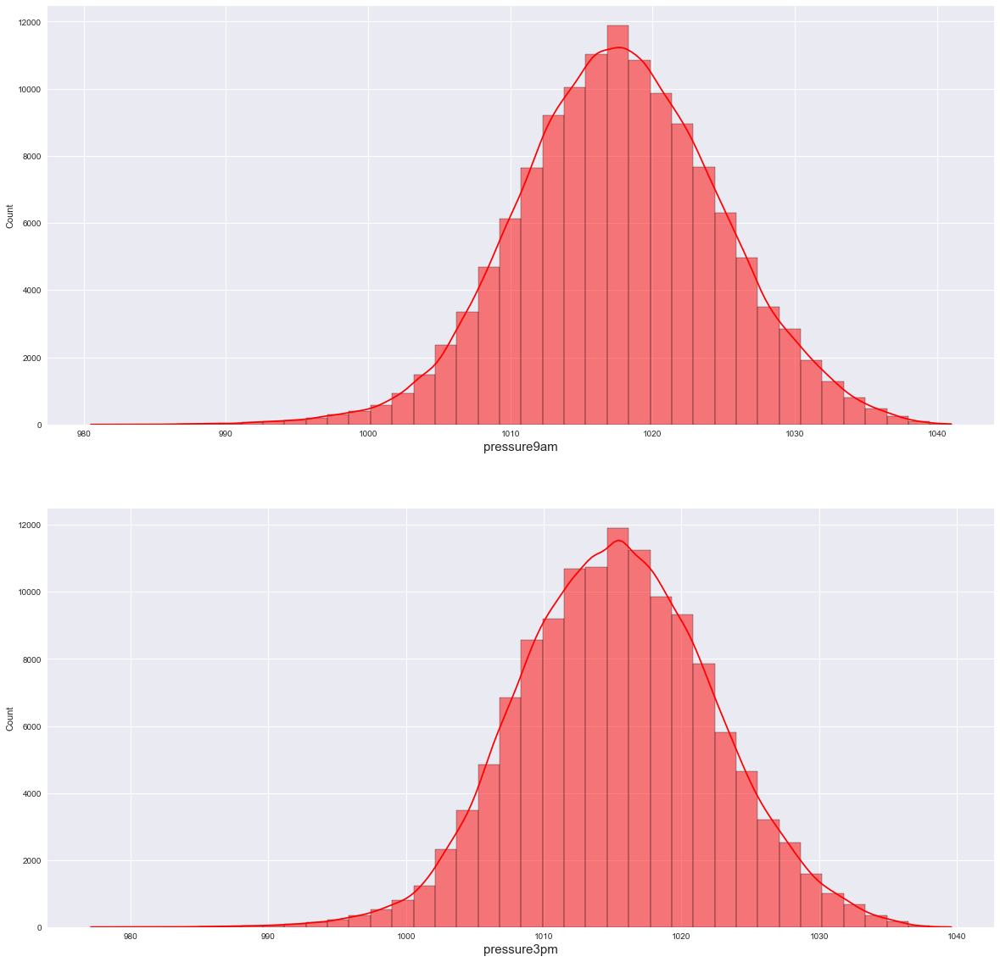

In [26]:
plt.style.use("seaborn")
fig, ax =plt.subplots(2,1, figsize=(20,20))

sns.histplot(df['pressure9am'], ax=ax[0], color="r", bins=40, kde=True)
ax[0].set_xlabel("pressure9am",fontsize=15)

sns.histplot(df['pressure3pm'], ax=ax[1], color="r", bins=40, kde=True)
ax[1].set_xlabel("pressure3pm",fontsize=15);

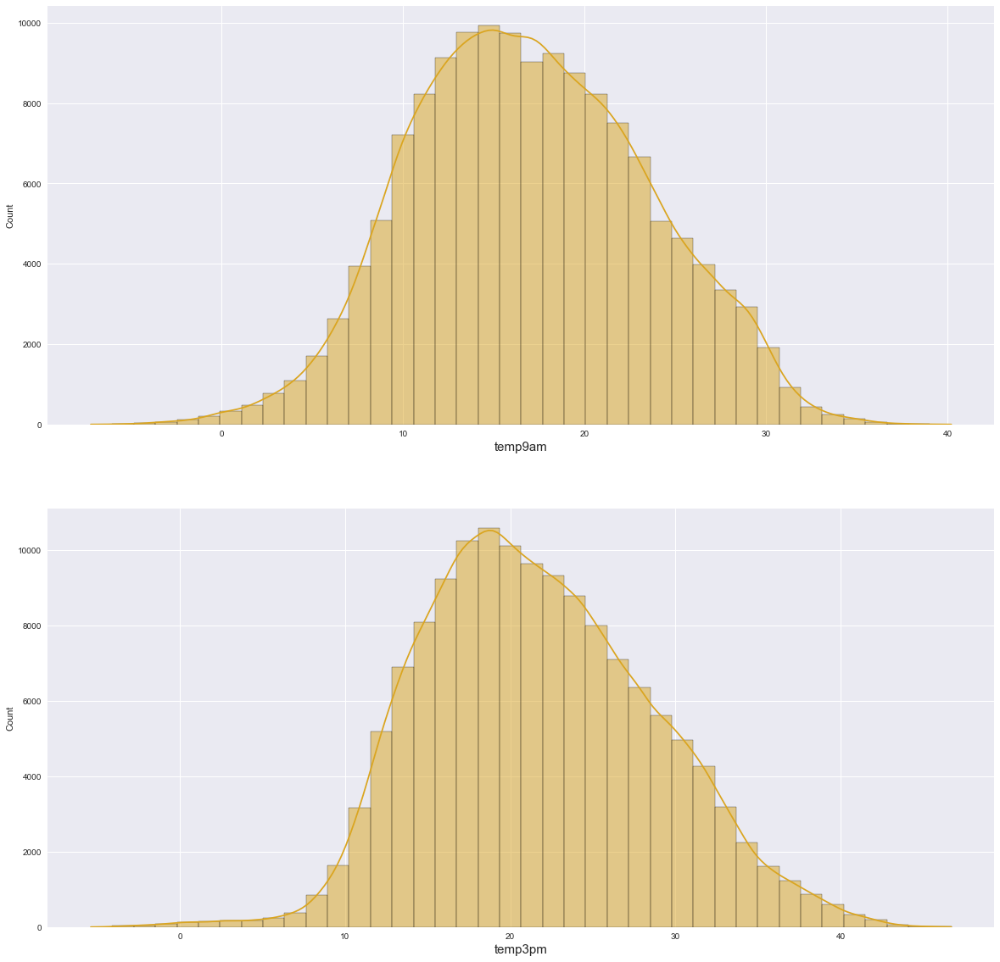

In [27]:
plt.style.use("seaborn")
fig, ax =plt.subplots(2,1, figsize=(20,20))

sns.histplot(df['temp9am'], ax=ax[0], color="goldenrod", bins=40, kde=True)
ax[0].set_xlabel("temp9am",fontsize=15)

sns.histplot(df['temp3pm'], ax=ax[1], color="goldenrod", bins=40, kde=True)
ax[1].set_xlabel("temp3pm",fontsize=15);

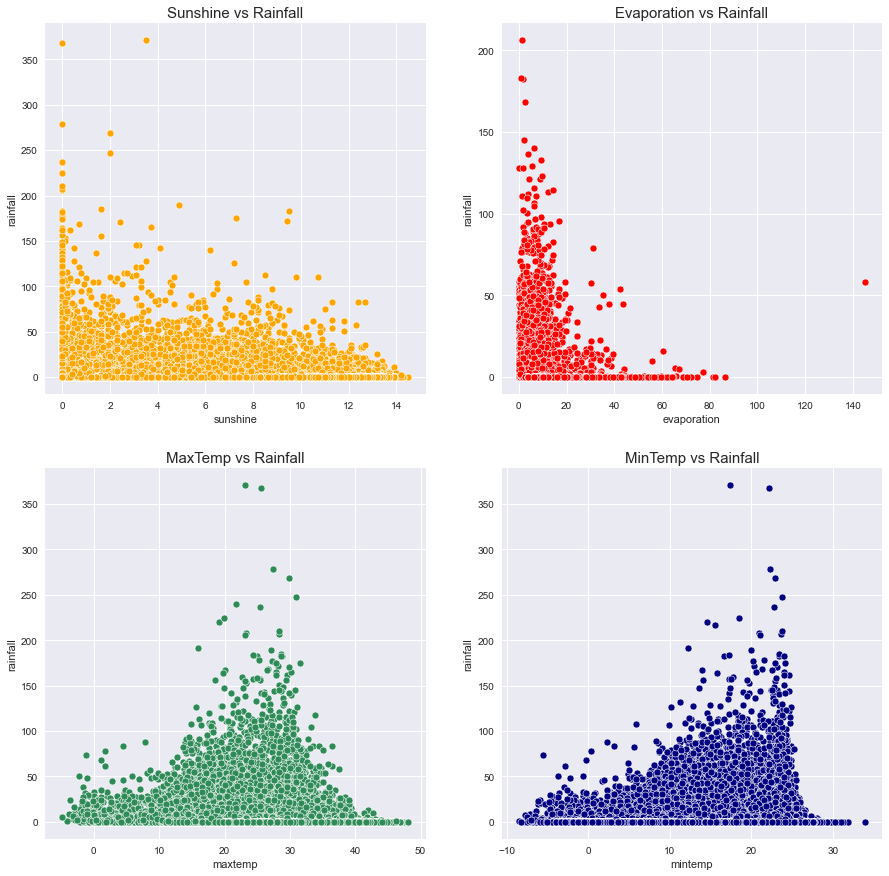

In [28]:
plt.style.use("seaborn")
fig, ax =plt.subplots(2,2, figsize=(15,15)) 

sns.scatterplot(x = df['sunshine'], y = df['rainfall'], ax=ax[0,0], color="orange");
ax[0,0].set_title("Sunshine vs Rainfall",fontsize=15);

sns.scatterplot(x = df['evaporation'], y = df['rainfall'], ax=ax[0,1], color="red");
ax[0,1].set_title("Evaporation vs Rainfall",fontsize=15);

sns.scatterplot(x = df['maxtemp'], y = df['rainfall'], ax=ax[1,0], color="seagreen");
ax[1,0].set_title("MaxTemp vs Rainfall",fontsize=15);

sns.scatterplot(x = df['mintemp'], y = df['rainfall'], ax=ax[1,1], color="navy");
ax[1,1].set_title("MinTemp vs Rainfall",fontsize=15);

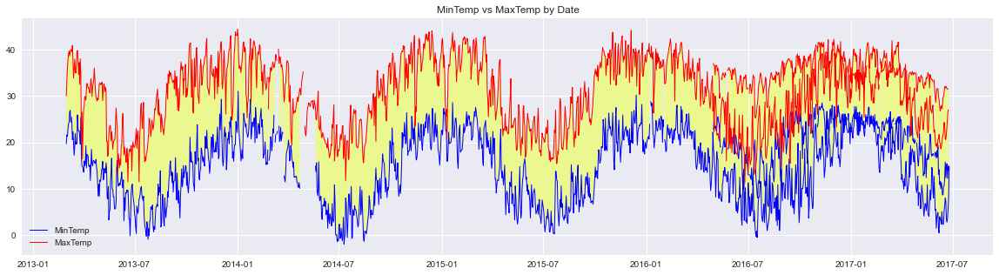

In [38]:
df_dateplot = df.iloc[-2000:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['date'],df_dateplot['mintemp'],color='blue',linewidth=1, label= 'MinTemp')
plt.plot(df_dateplot['date'],df_dateplot['maxtemp'],color='red',linewidth=1, label= 'MaxTemp')
plt.fill_between(df_dateplot['date'],df_dateplot['mintemp'],df_dateplot['maxtemp'], facecolor = '#EBF78F')
plt.title('MinTemp vs MaxTemp by Date')
plt.legend(loc='lower left', frameon=False)
plt.show()

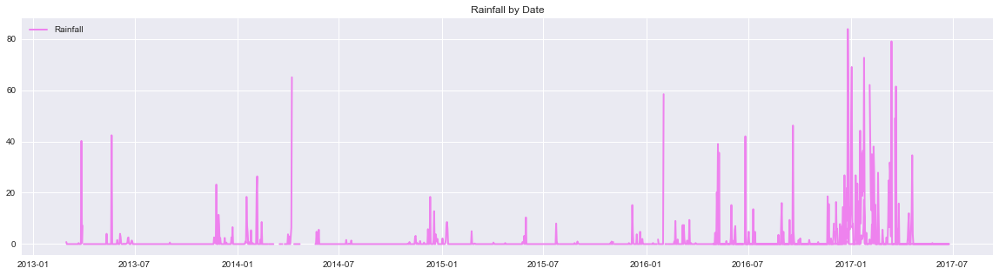

In [40]:
df_dateplot = df.iloc[-2000:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['date'],df_dateplot['rainfall'],color='violet', linewidth=2, label= 'Rainfall')
plt.legend(loc='upper left', frameon=False)
plt.title('Rainfall by Date')
plt.show()

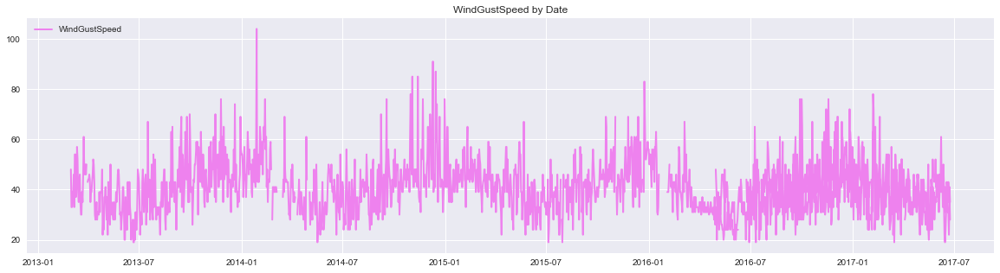

In [43]:
df_dateplot = df.iloc[-2000:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['date'],df_dateplot['windgustspeed'],color='violet', linewidth=2, label= 'WindGustSpeed')
plt.legend(loc='upper left', frameon=False)
plt.title('WindGustSpeed by Date')
plt.show()

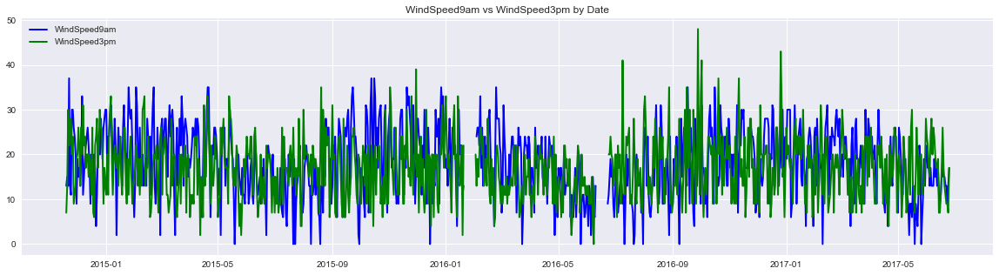

In [46]:
df_dateplot = df.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['date'],df_dateplot['windspeed9am'],color='blue', linewidth=2, label= 'WindSpeed9am')
plt.plot(df_dateplot['date'],df_dateplot['windspeed3pm'],color='green', linewidth=2, label= 'WindSpeed3pm')
plt.legend(loc='upper left', frameon=False)
plt.title('WindSpeed9am vs WindSpeed3pm by Date')
plt.show()

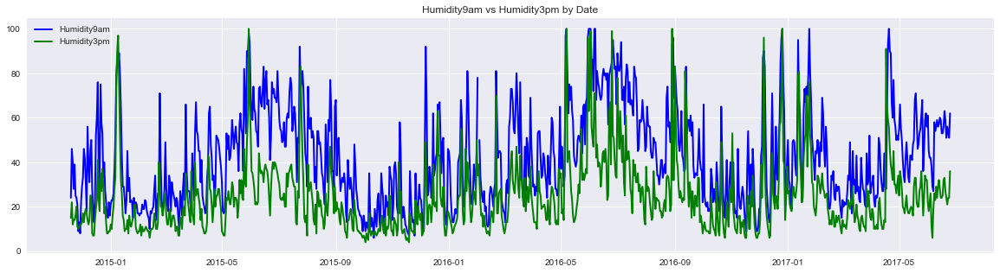

In [47]:
df_dateplot = df.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['date'],df_dateplot['humidity9am'],color='blue', linewidth=2, label= 'Humidity9am')
plt.plot(df_dateplot['date'],df_dateplot['humidity3pm'],color='green', linewidth=2, label= 'Humidity3pm')
plt.legend(loc='upper left', frameon=False)
plt.title('Humidity9am vs Humidity3pm by Date')
plt.show()

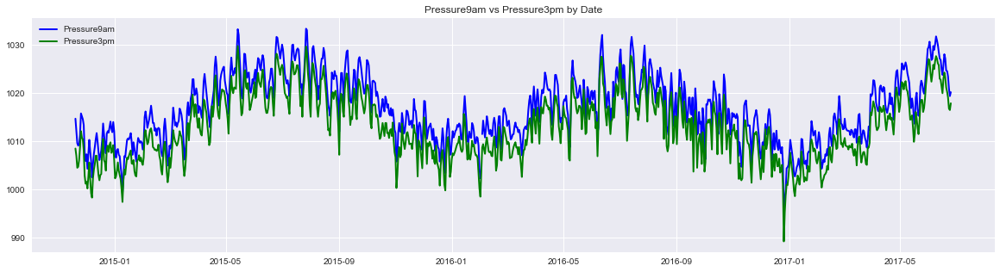

In [48]:
df_dateplot = df.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['date'],df_dateplot['pressure9am'],color='blue', linewidth=2, label= 'Pressure9am')
plt.plot(df_dateplot['date'],df_dateplot['pressure3pm'],color='green', linewidth=2, label= 'Pressure3pm')
plt.legend(loc='upper left', frameon=False)
plt.title('Pressure9am vs Pressure3pm by Date')
plt.show()

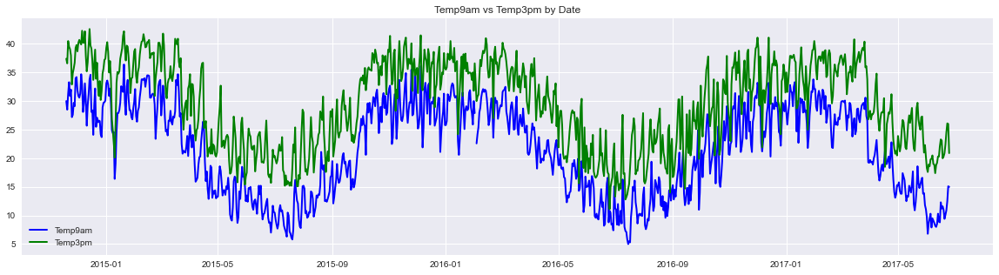

In [49]:
df_dateplot = df.iloc[-950:,:]
plt.figure(figsize=[20,5])
plt.plot(df_dateplot['date'],df_dateplot['temp9am'],color='blue', linewidth=2, label= 'Temp9am')
plt.plot(df_dateplot['date'],df_dateplot['temp3pm'],color='green', linewidth=2, label= 'Temp3pm')
plt.legend(loc='lower left', frameon=False)
plt.title('Temp9am vs Temp3pm by Date')
plt.show()

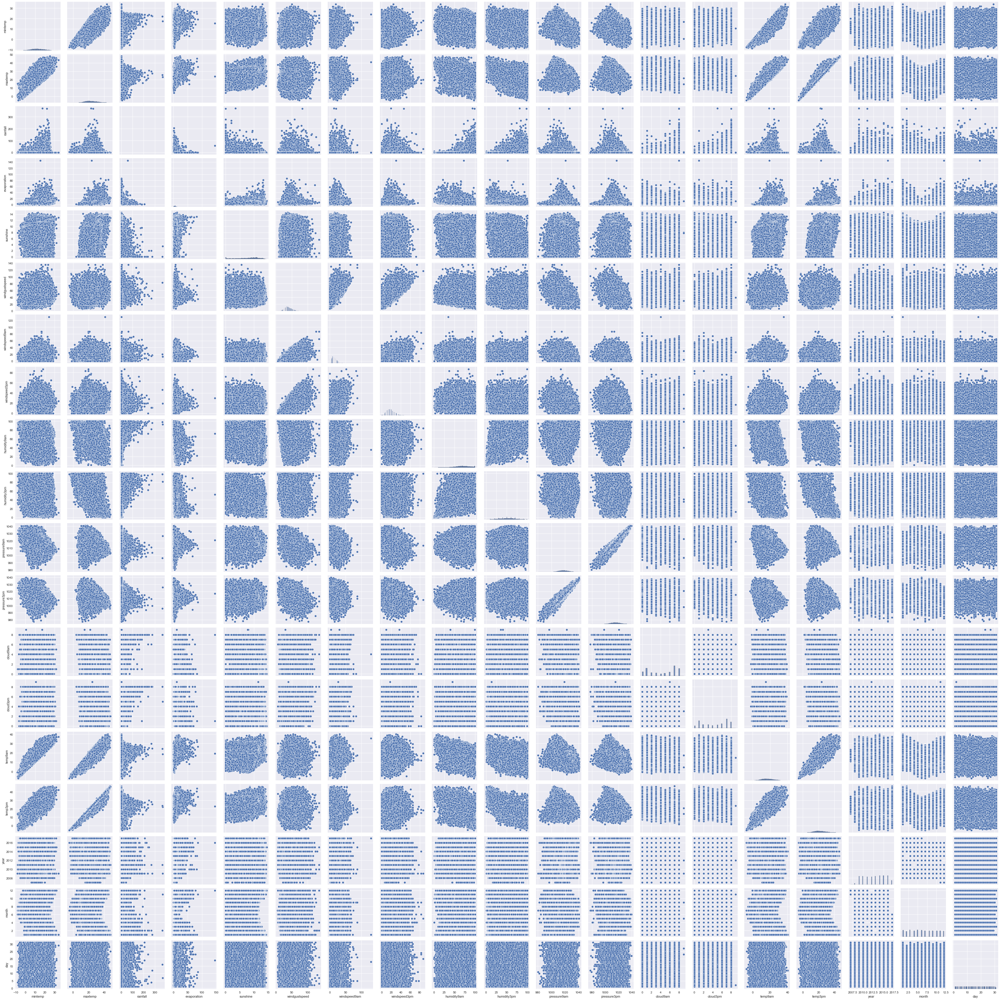

In [50]:
sns.pairplot(data=df)
plt.show()